# Topic Modelling on Reddit Posts relating to Capital Punishment

## Import Libraries and Data

In [1]:
# import libraries
import csv
import pandas as pd
import gensim
import gensim.corpora as corpora
from gensim import models
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel
from gensim.similarities import SparseMatrixSimilarity
import spacy
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import matplotlib.pyplot as plt
%matplotlib inline

from __future__ import print_function
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [3]:
# load corpus
dates = []
corpus_raw = []

# attach from posts
with open("rel_posts_final_248.csv", "r", encoding = "utf-8") as f:
    csv_reader = csv.reader(f, delimiter = ",")
    line_count = 0
    for line in csv_reader:
        if line_count > 0 and line[6] != "":
            # only process from second line onwards, as the first line is the header
            # line[6] is the selftext column
            dates.append(pd.to_datetime(line[3], dayfirst=True))
            corpus_raw.append(line[6])
        line_count += 1
        
# attach from comments
with open("rel_comments_2566.csv", "r", encoding = "utf-8") as f:
    csv_reader = csv.reader(f, delimiter = ",")
    line_count = 0
    for line in csv_reader:
        if line_count > 0:
            # only process from second line onwards, as the first line is the header
            # line[5] is the body column
            dates.append(pd.to_datetime(line[3]))
            corpus_raw.append(line[5])
        line_count += 1  

In [4]:
# set stopwords
from nltk.corpus import stopwords
customised_stop_words = stopwords.words('english')
customised_stop_words.extend(["from", "use", "death", "would", "penalty", "like", "dont", "want", "say", "get", "singapore", "singaporean", "http", "gt", "n't",
                              "people", "make", "think", "https", "u", "one", "even", "still", "also", "many", "just", "im", "a2", "shan"])

## Topic Modelling

### Using LDA

In [5]:
### preprocessing on corpus ###

# case normalisation
corpus = [doc.lower() for doc in corpus_raw]

# tokenization
corpus = [word_tokenize(doc) for doc in corpus]

# remove non-word tokens like punctuations
corpus = [[token for token in doc if token[0].isalpha()] for doc in corpus]

# remove stop words
stop_set = set(customised_stop_words)
corpus = [[token for token in doc if token not in stop_set] for doc in corpus]

# lemmatisation
lemmatizer = WordNetLemmatizer()
corpus = [[lemmatizer.lemmatize(token) for token in doc] for doc in corpus]

### create vector space model (bow) ###

# construct vocabulary and filter extremes
vocab = corpora.Dictionary(corpus)
vocab.filter_extremes(no_below = 2, no_above = 0.30)

# build bag-of-words for each document
bow = [vocab.doc2bow(doc) for doc in corpus]

In [8]:
### Check on optimal number of topics ###

# Can take a long time to run. In this case we are going to k_max=10.
import datetime
print(datetime.datetime.now())

model_list = []
coherence_values = [] # this list stores coherence scores
model_topics = []
x = range(2, 6)

for num_topics in x:
    sg_lda_x = gensim.models.ldamodel.LdaModel(corpus=bow, id2word=vocab, num_topics=num_topics, random_state = 1234)
    # uncomment the following if you are testing out LDA Mallet using an older version of Gensim
    # sg_lda_x = gensim.models.wrappers.LdaMallet(mallet_path, iterations=100, corpus=sg_vecs, num_topics=no_topics, id2word=sg_dictionary)
    coherencemodel = CoherenceModel(model=sg_lda_x, texts=corpus, dictionary=vocab, coherence='c_v')
    model_topics.append(num_topics)
    model_list.append(sg_lda_x)
    coherence_score = coherencemodel.get_coherence()
    coherence_values.append(coherence_score)
    print(f'Num Topics = {num_topics}, score = {coherence_score}')

print(datetime.datetime.now())
del sg_lda_x, coherencemodel, coherence_score # variables not needed; free up memory

2023-07-01 10:56:49.137629
Num Topics = 2, score = 0.3625786779540956
Num Topics = 3, score = 0.39519942769672084
Num Topics = 4, score = 0.36731744512484166
Num Topics = 5, score = 0.3817050247997062
2023-07-01 10:57:50.374486


In [9]:
### apply topic modelling ###

# build the model
n_topic = 3
lda = models.LdaModel(bow, id2word = vocab, num_topics = n_topic, random_state = 1234)

# print out each topic, where each topic is represented by top n words
print("Topics")
for i in range(n_topic):
    print(f"{i}: {lda.print_topic(i, topn = 10)}")

Topics
0: 0.011*"law" + 0.009*"life" + 0.007*"crime" + 0.005*"country" + 0.004*"punishment" + 0.004*"weed" + 0.004*"sentence" + 0.004*"murder" + 0.004*"year" + 0.004*"trafficking"
1: 0.007*"country" + 0.006*"life" + 0.005*"law" + 0.005*"case" + 0.005*"crime" + 0.005*"punishment" + 0.004*"trafficker" + 0.004*"trafficking" + 0.004*"way" + 0.004*"someone"
2: 0.008*"court" + 0.007*"case" + 0.005*"said" + 0.005*"life" + 0.005*"law" + 0.005*"execution" + 0.005*"person" + 0.005*"time" + 0.005*"trafficking" + 0.004*"sentence"


In [10]:
# print out 2 documents to see what topics they are discussing too
for i in range(2):
    print("Raw text:", corpus_raw[i], '\n')
    print("Topic distribution:", lda[bow[i]], '\n')

Raw text: I saw the recent case in Singapore recently about the low IQ smuggler being put to death and I was just wondering why Singapore still has capital punishment? Why do people think it's still the right thing? 

Topic distribution: [(0, 0.44317976), (1, 0.39637408), (2, 0.16044618)] 

Raw text: It was only a few years ago when a lawyer friend shared with me more about the workings of our laws (how judges have no discretion in meting out the death penalty if the accused was found guilty + failed to substantively assist the authorities in disrupting drug trafficking activities) when I found myself questioning our current set of laws. 

Still I was always on the fence - I've read accounts of how damaging drugs like heroin and meth can be, and too read about the opioids crisis in US -, unsure about what stance to take.

But then just yesterday I came across the article that reported about the to-be hanging of Tangaraju Suppiah, a fellow Singaporean who was found guilty of trafficking

In [12]:
# # visualise topics
# lda_viz = gensimvis.prepare(lda, bow, vocab)
# pyLDAvis.save_html(lda_viz, "nltk_3topics.html")

### Using BERTopic

In [11]:
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from sklearn.feature_extraction import text
from sklearn.feature_extraction.text import CountVectorizer
from hdbscan import HDBSCAN
from umap import UMAP
import pickle

C:\Users\fongb\miniconda3\envs\ds\lib\site-packages\umap\distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
C:\Users\fongb\miniconda3\envs\ds\lib\site-packages\umap\distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
C:\Users\fongb\miniconda3\envs\ds\lib\site-packages\umap\distances.py:1086: NumbaDeprecationWa

**Note: The following code takes a while to run.**

In [13]:
# case normalisation
corpus = [doc.lower() for doc in corpus_raw]

# set stopwords
vectorizer_model = CountVectorizer(stop_words=list(customised_stop_words))

# embedding model
model_embedding = SentenceTransformer("all-MiniLM-L6-v2")
corpus_embeddings = model_embedding.encode(corpus)
umap_model = UMAP(random_state=42)

model = BERTopic(
    n_gram_range=(1, 2),
    vectorizer_model=vectorizer_model,
    nr_topics='auto',
    min_topic_size=20,
    umap_model = umap_model,
    calculate_probabilities=True).fit(corpus, corpus_embeddings)

In [14]:
# generate predicted topics and models
topics, probabilities = model.transform(corpus, corpus_embeddings)

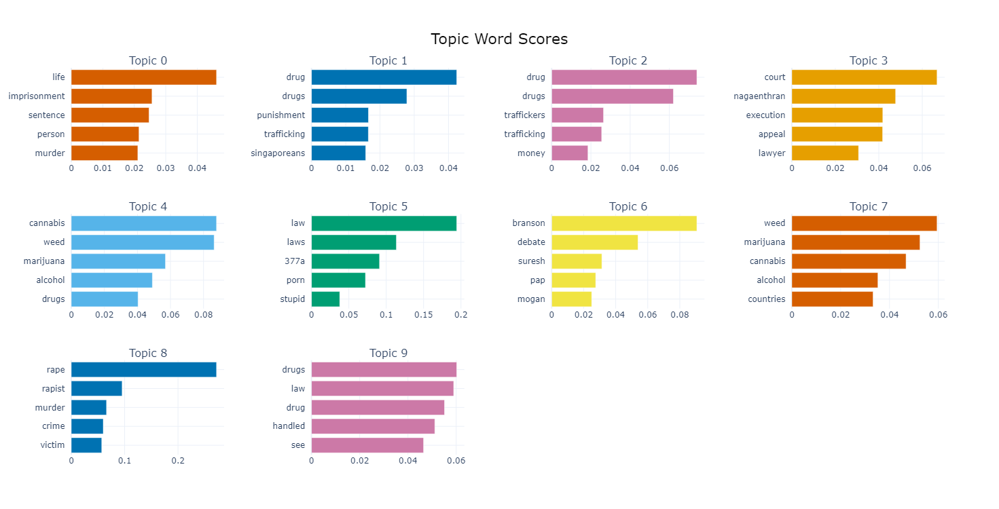

In [15]:
# visualising the topics and top words
model.visualize_barchart(top_n_topics=10)

In [16]:
# checking number of documents in each topic
df_topic_freq = model.get_topic_freq()
topics_count = len(df_topic_freq) - 1
df_topic_freq

,Topic,Count
1,-1,718
6,0,552
0,1,480
2,2,428
4,3,131
9,4,131
3,5,56
8,6,46
5,7,43
7,8,33


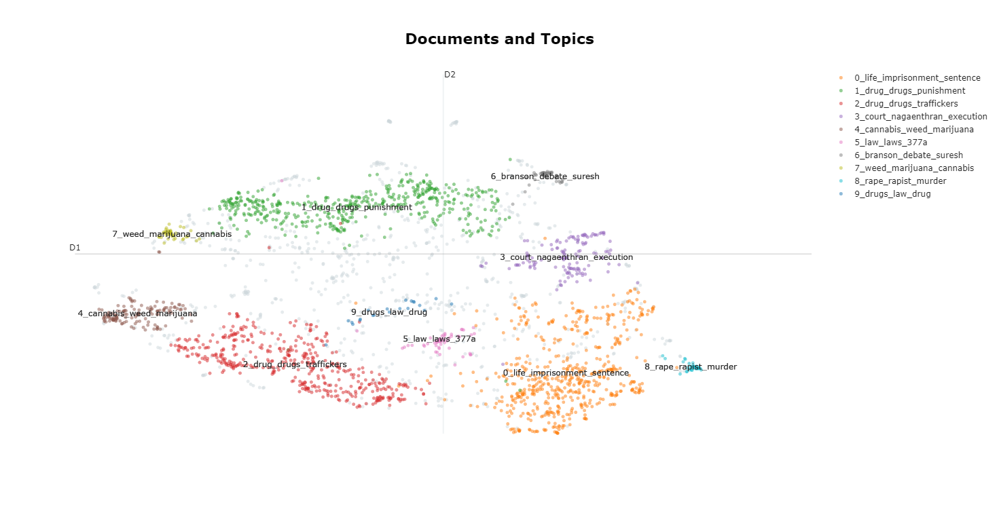

In [17]:
# visualising documents inside topics
reduced_embeddings = UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine').fit_transform(corpus_embeddings)
model.visualize_documents(corpus, reduced_embeddings=reduced_embeddings)

In [18]:
# to manually select topics to merge (if required)
topics_to_merge = [
    [1,2,4,7,9]
]
model.merge_topics(corpus, topics_to_merge)

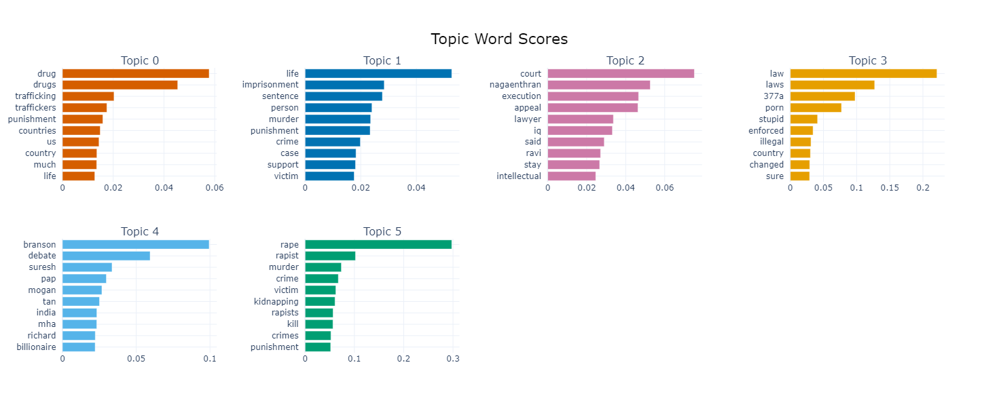

In [19]:
# visualising the updated topics and top words
fig = model.visualize_barchart(top_n_topics=topics_count, n_words = 10, width = 300, height = 300)
fig

In [21]:
# # save barchart to html file
# fig.write_html("barchart.html")

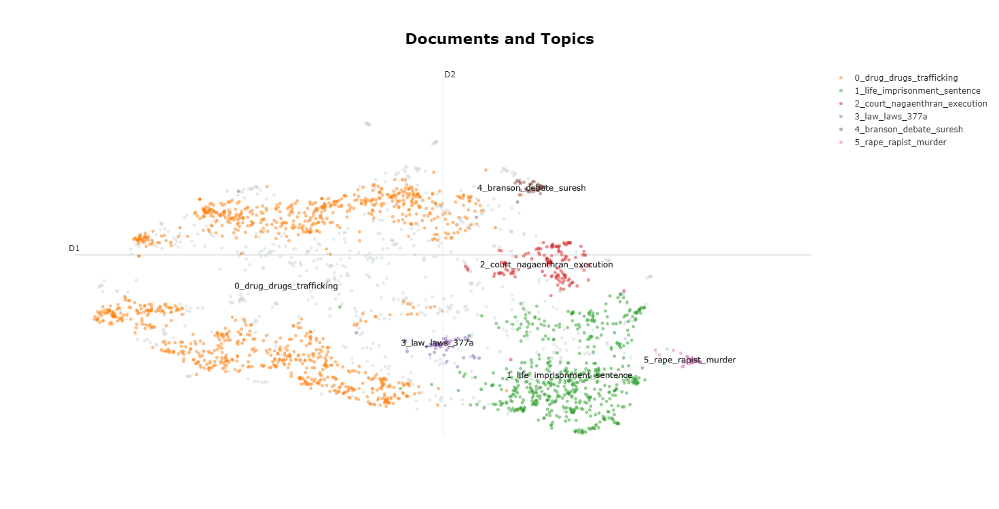

In [20]:
# visualising documents inside updated topics
reduced_embeddings = UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine').fit_transform(corpus_embeddings)
model.visualize_documents(corpus, reduced_embeddings=reduced_embeddings)

In [22]:
# checking number of documents in each topic
df_topic_freq = model.get_topic_freq()
topics_count = len(df_topic_freq) - 1
df_topic_freq

,Topic,Count
0,0,1102
1,-1,718
4,1,552
3,2,131
2,3,56
6,4,46
5,5,33


https://www.reuters.com/world/malaysian-man-death-row-singapore-drugs-charges-executed-family-2022-04-27/

singapore, april 27 (reuters) - a malaysian man convicted of drug trafficking was executed on wednesday in singapore despite appeals for clemency on the grounds that he had an intellectual disability, his family said.

nagaenthran dharmalingam, 34, had been on death row for more than a decade for trafficking 44 grams (1.5 oz) of heroin into singapore, which has some of the world's toughest narcotics laws. his lawyers had filed multiple appeals against his execution saying he was intellectually disabled.

his brother navin kumar, 22, said by telephone the execution had been carried out and said the body would be sent back to malaysia where a funeral would be held in the town of ipoh.

a singapore court on tuesday had turned down a legal challenge put forward by nagaenthran's mother, clearing the way for the execution by hanging.

at the end of tuesday's hearing, dharmalingam and hi

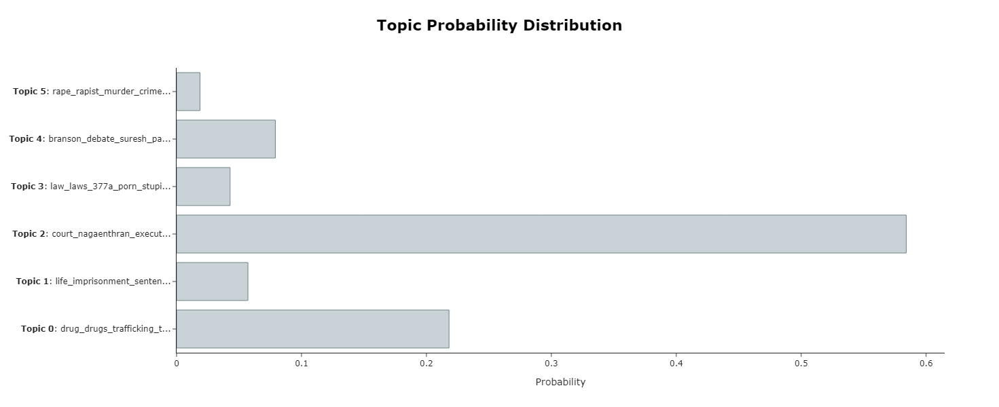

In [23]:
# approximate topic distribution for documents
topic_distr, _ = model.approximate_distribution(corpus)

# understand why a single document is assigned to a particular topic
doc_id = 9
print(corpus[doc_id])
model.visualize_distribution(topic_distr[doc_id])

In [24]:
# calculate the topic distributions on a token-level
topic_distr, topic_token_distr = model.approximate_distribution(corpus, calculate_tokens=True)

# visualise the token-level distributions
doc_id = 9
print(corpus[doc_id])
model.visualize_approximate_distribution(corpus[doc_id], topic_token_distr[doc_id])

https://www.reuters.com/world/malaysian-man-death-row-singapore-drugs-charges-executed-family-2022-04-27/

singapore, april 27 (reuters) - a malaysian man convicted of drug trafficking was executed on wednesday in singapore despite appeals for clemency on the grounds that he had an intellectual disability, his family said.

nagaenthran dharmalingam, 34, had been on death row for more than a decade for trafficking 44 grams (1.5 oz) of heroin into singapore, which has some of the world's toughest narcotics laws. his lawyers had filed multiple appeals against his execution saying he was intellectually disabled.

his brother navin kumar, 22, said by telephone the execution had been carried out and said the body would be sent back to malaysia where a funeral would be held in the town of ipoh.

a singapore court on tuesday had turned down a legal challenge put forward by nagaenthran's mother, clearing the way for the execution by hanging.

at the end of tuesday's hearing, dharmalingam and hi

In [28]:
# set topic labels
topic_labels_dict = {
    0: "Drugs and trafficking",
    1: "Imprisonment vs Capital Punishment",
    2: "Case of Nagaenthran Dharmalingam",
    3: "Comments on Singapore’s law",
    4: "Commentary by Richard Branson",
    5: "Capital punishment for rape and other crimes",
}
model.set_topic_labels(topic_labels_dict)

In [29]:
# # save model
# model.save("bertopic_model", serialization="pickle")

# # load model
# loaded_model = BERTopic.load("bertopic_model")

### Dynamic Topic Modeling using BERTopic

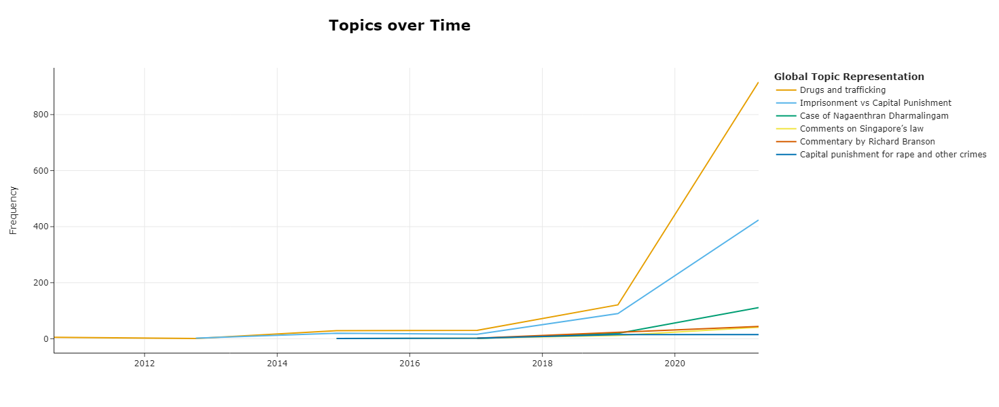

In [30]:
topics_over_time = model.topics_over_time(corpus, dates, nr_bins = 6)
model.visualize_topics_over_time(topics_over_time, top_n_topics = 6, custom_labels = topic_labels_dict, height = 600)

In [32]:
topic_info = model.get_topic_info()
topic_info

,Topic,Count,Name,CustomName,Representation,Representative_Docs
0,-1,718,-1_drugs_drug_said_law,-1_drugs_drug_said_law,"[drugs, drug, said, law, heroin, man, sg, traf...",[singaporeâ€™s only mention in the world war z...
1,0,1102,0_drug_drugs_trafficking_traffickers,Drugs and trafficking,"[drug, drugs, trafficking, traffickers, punish...","[as i grow older, i came to the belief that go..."
2,1,552,1_life_imprisonment_sentence_person,Imprisonment vs Capital Punishment,"[life, imprisonment, sentence, person, murder,...",[singapore: after about two years of discussin...
3,2,131,2_court_nagaenthran_execution_appeal,Case of Nagaenthran Dharmalingam,"[court, nagaenthran, execution, appeal, lawyer...",[&gt; # malaysian drug trafficker seeks indepe...
4,3,56,3_law_laws_377a_porn,Comments on Singapore’s law,"[law, laws, 377a, porn, stupid, enforced, ille...","['not as popular' as in stuff aside from 377a,..."
5,4,46,4_branson_debate_suresh_pap,Commentary by Richard Branson,"[branson, debate, suresh, pap, mogan, tan, ind...",[there's been much praise for tony tan in the ...
6,5,33,5_rape_rapist_murder_crime,Capital punishment for rape and other crimes,"[rape, rapist, murder, crime, victim, kidnappi...","[hi op, i understand why people feel that rapi..."


In [33]:
# # tagging the data and export
# df = pd.DataFrame({
#         'Date': dates,
#         'Text': corpus,
#         'Topics': model.topics_
# })

# # map topic labels to df
# df['Topic_label'] = df["Topics"].map(topic_labels_dict)

# # save df to csv
# df.to_csv('posts_and_comments_with_topics.csv', index=False)

## References

- [Topic Modeling with BERTopic: A Cookbook with an End-to-end Example (Part 1)](https://medium.com/@nick-tan/topic-modeling-with-bertopic-a-cookbook-with-an-end-to-end-example-part-1-3ef739b8d9f8)
- [Topic Modeling with BERTopic: A Cookbook with an End-to-end Example (Part 2)](https://medium.com/@nick-tan/topic-modeling-with-bertopic-a-cookbook-with-an-end-to-end-example-part-2-1ae591f76a25)
- [An in-depth introduction to Topic Modeling using LDA and BERTopic](https://medium.com/cmotions/an-in-depth-introduction-to-topic-modeling-using-lda-and-bertopic-a71d3ed5b889)
- [Topic Modeling with LSA, pLSA, LDA, NMF, BERTopic, Top2Vec: a Comparison](https://towardsdatascience.com/topic-modeling-with-lsa-plsa-lda-nmf-bertopic-top2vec-a-comparison-5e6ce4b1e4a5)
- [Dynamic Topic Modeling](https://maartengr.github.io/BERTopic/getting_started/topicsovertime/topicsovertime.html#visualization)
- [Topic Distribution](https://maartengr.github.io/BERTopic/getting_started/distribution/distribution.html)